# Lesson 5

In [4]:
# Paths
import pathlib

MAIN_PATH = pathlib.Path().resolve()
DATA_DIRECTORY = MAIN_PATH / "notebooks" / "lessons" / "lesson-5" / "data"
SAVE_DIRECTORY = MAIN_PATH / "lesson-5"

In [5]:
# Import Helsinki railway data
import geopandas
import numpy

accessibility_grid = geopandas.read_file(
    DATA_DIRECTORY
    / "helsinki_region_travel_times_to_railway_station"
    / "helsinki_region_travel_times_to_railway_station.gpkg"
)
accessibility_grid["pt_r_t"] = accessibility_grid["pt_r_t"].replace(-1, numpy.nan)

WFS_BASE_URL = (
    "https://kartta.hel.fi/ws/geoserver/avoindata/wfs"
    "?service=wfs"
    "&version=2.0.0"
    "&request=GetFeature"
    "&srsName=EPSG:3879"
    "&typeName={layer:s}"
)

#fix for bug
import ssl
ssl._create_default_https_context = ssl._create_unverified_context

metro = (
    geopandas.read_file(
        WFS_BASE_URL.format(layer="avoindata:Seutukartta_liikenne_metro_rata")
    )
    .set_crs("EPSG:3879")
)
roads = (
    geopandas.read_file(
        WFS_BASE_URL.format(layer="avoindata:Seutukartta_liikenne_paatiet")
    )
    .set_crs("EPSG:3879")
)

In [6]:
# Check if data is in the same CRS
assert accessibility_grid.crs == metro.crs == roads.crs, "Input data sets’ CRS differs"

AssertionError: Input data sets’ CRS differs

In [7]:
roads = roads.to_crs(accessibility_grid.crs)
metro = metro.to_crs(accessibility_grid.crs)

assert accessibility_grid.crs == metro.crs == roads.crs, "Input data sets’ CRS differs"


### Plotting a multi-layer map

(6665250.00004393, 6698000.000038021)

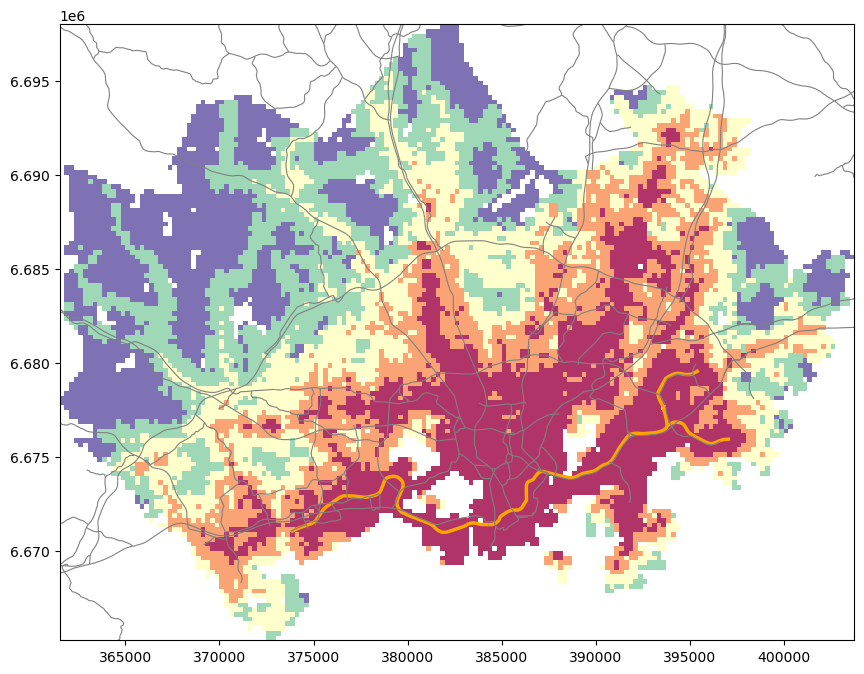

In [8]:
ax = accessibility_grid.plot(
    figsize=(12,8),
    
    column="pt_r_t",
    scheme="quantiles",
    cmap="Spectral",
    linewidth=0,
    alpha=0.8
)

metro.plot(
    ax=ax,
    color="orange",
    linewidth=2.5
)

roads.plot(
    ax=ax,
    color="grey",
    linewidth=0.8
)

minx, miny, maxx, maxy = accessibility_grid.total_bounds
ax.set_xlim(minx,maxx)
ax.set_ylim(miny,maxy)

### Adding a legend

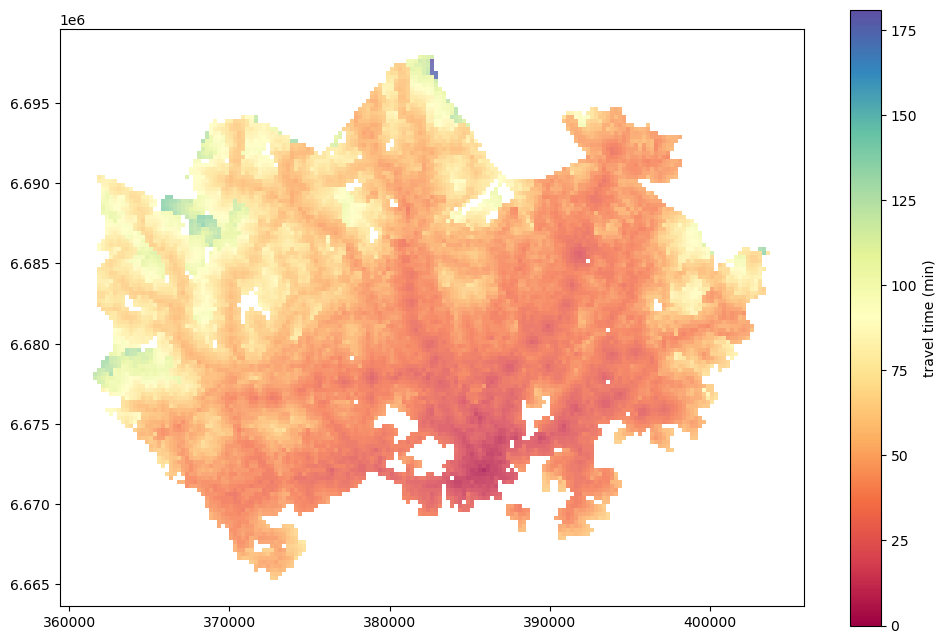

In [9]:
ax = accessibility_grid.plot(
    figsize=(12,8),
    
    column="pt_r_t",
    cmap="Spectral",
    linewidth=0,
    alpha=0.8,
    
    legend=True,
    legend_kwds={"label": "travel time (min)"}
)

<AxesSubplot: >

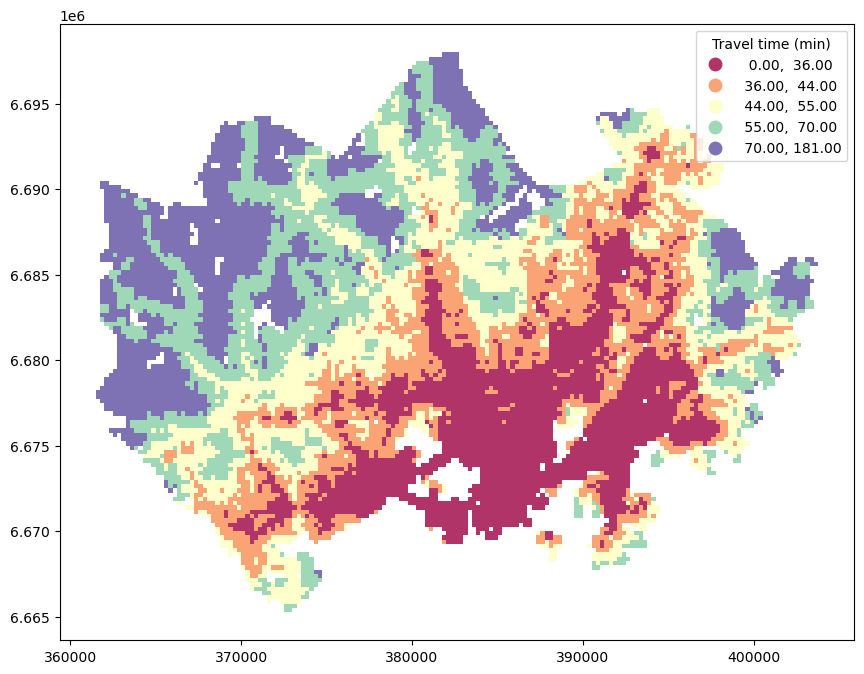

In [10]:
accessibility_grid.plot(
    figsize=(12,8),
    
    column="pt_r_t",
    scheme="quantiles",
    cmap="Spectral",
    linewidth=0,
    alpha=0.8,
    
    legend=True,
    legend_kwds={"title": "Travel time (min)"}
)

### Adding a base map

In [11]:
# Convert data to Web Mercador
accessibility_grid = accessibility_grid.to_crs("EPSG:3857")
metro = metro.to_crs("EPSG:3857")
roads = roads.to_crs("EPSG:3857")

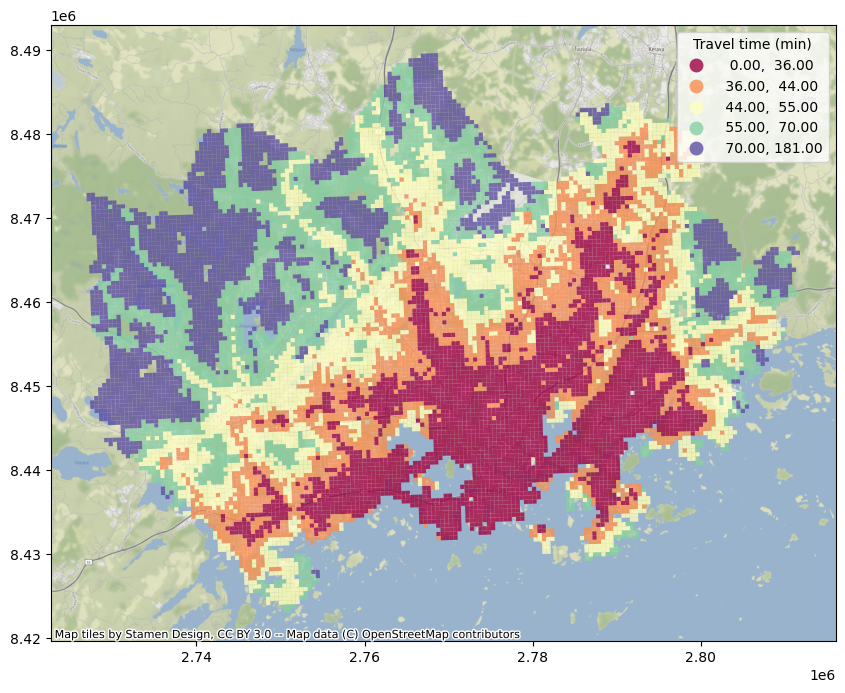

In [12]:
# Use contextily to add a base map
import contextily

ax = accessibility_grid.plot(
    figsize=(12,8),
    
    column="pt_r_t",
    scheme="quantiles",
    cmap="Spectral",
    linewidth=0,
    alpha=0.8,
    
    legend=True,
    legend_kwds={"title": "Travel time (min)"}
)
contextily.add_basemap(ax)

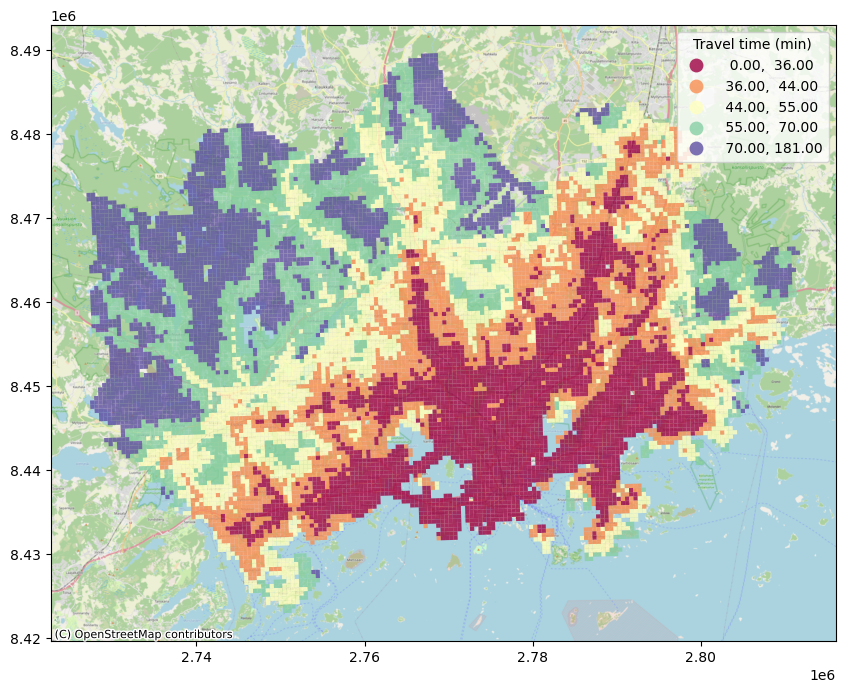

In [13]:
ax = accessibility_grid.plot(
    figsize=(12, 8),

    column="pt_r_t",
    scheme="quantiles",
    cmap="Spectral",
    linewidth=0,
    alpha=0.8,

    legend=True,
    legend_kwds={"title": "Travel time (min)"}
)
contextily.add_basemap(
    ax,
    source=contextily.providers.OpenStreetMap.Mapnik
)

C:\Users\PC\miniconda3\envs\autogis\lib\site-packages\mapclassify\classifiers.py:238: UserWarning: Warning: Not enough unique values in array to form k classes
  Warn(
C:\Users\PC\miniconda3\envs\autogis\lib\site-packages\mapclassify\classifiers.py:241: UserWarning: Warning: setting k to 6
  Warn("Warning: setting k to %d" % k_q, UserWarning)


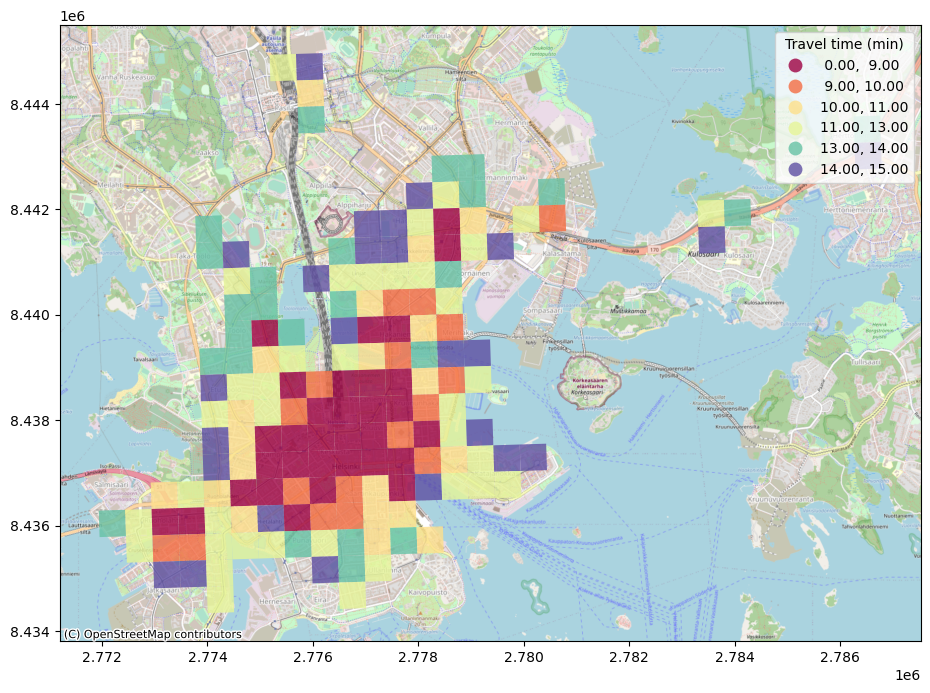

In [14]:
# Zoom in
ax = accessibility_grid[accessibility_grid.pt_r_t <= 15].plot(
    figsize=(12, 8),

    column="pt_r_t",
    scheme="quantiles",
    k=7,
    cmap="Spectral",
    linewidth=0,
    alpha=0.8,

    legend=True,
    legend_kwds={"title": "Travel time (min)"}
)
contextily.add_basemap(
    ax,
    source=contextily.providers.OpenStreetMap.Mapnik,
    attribution=(
        "Travel time data (c) Digital Geography Lab, "
        "map data (c) OpenStreetMap contributors"
    )
)


## Interactive maps

In [22]:
import pathlib
MAIN_PATH = pathlib.Path().resolve()
DATA_DIRECTORY = MAIN_PATH / "notebooks" / "lessons" / "lesson-5" / "data"
SAVE_DIRECTORY = MAIN_PATH / "lesson-5"

# We will export HTML pages during this lesson,
# let’s also prepare an output directory for them:
HTML_DIRECTORY = SAVE_DIRECTORY / "html"
HTML_DIRECTORY.mkdir(exist_ok=True)

In [17]:
import folium

map = folium.Map(
    location=(60.2, 24.8),
    zoom_start=10,
    control_scale=True
)

map

In [23]:
# Save the map
map.save(HTML_DIRECTORY / "base-map.html")

In [19]:
# Change the base map
map = folium.Map(
    location=(40.7, -73.9),
    zoom_start=12,
    tiles="Stamen Toner"
)
map

In [20]:
# Add points

map = folium.Map(
    location=(60.2, 25.0),
    zoom_start=12
)

kumpula = folium.Marker(
    location=(60.204, 24.962),
    tooltip="Kumpula Campus",
    icon=folium.Icon(color="green", icon="ok-sign")
)
kumpula.add_to(map)

map

## Add a layer of points

In [24]:
import geopandas

addresses = geopandas.read_file(DATA_DIRECTORY / "addresses.gpkg")
addresses

,address,geometry
0,"Ruoholahti, 14, Itämerenkatu, Ruoholahti, Läns...",POINT (24.91556 60.16320)
1,"Kamppi, 1, Kampinkuja, Kamppi, Eteläinen suurp...",POINT (24.93166 60.16905)
2,"Bangkok9, 8, Kaivokatu, Keskusta, Kluuvi, Etel...",POINT (24.94168 60.16996)
3,"Hermannin rantatie, Verkkosaari, Kalasatama, S...",POINT (24.97783 60.18892)
4,"9, Tyynenmerenkatu, Jätkäsaari, Länsisatama, E...",POINT (24.92151 60.15662)
5,"18, Kontulantie, Kontula, Mellunkylä, Itäinen ...",POINT (25.08174 60.23522)
6,"Itäväylä, Vartioharju, Vartiokylä, Itäinen suu...",POINT (25.10651 60.21957)
7,"Tapulikaupungintie, Tapulikaupunki, Suutarila,...",POINT (25.02948 60.27858)
8,"Sompionpolku, Fallkullan kiila, Tapanila, Tapa...",POINT (25.02867 60.26370)
9,"Sodexo, 5, Atomitie, Strömberg, Pitäjänmäen te...",POINT (24.87103 60.22250)


In [25]:
map = folium.Map(
    location=(60.2, 25.0),
    zoom_start=12
)

addresses_layer = folium.features.GeoJson(
    addresses,
    name="Public transport stops"
)
addresses_layer.add_to(map)

map

In [26]:
# Adding a polygon
population_grid = (
    geopandas.read_file(
        "https://kartta.hsy.fi/geoserver/wfs"
        "?service=wfs"
        "&version=2.0.0"
        "&request=GetFeature"
        "&typeName=asuminen_ja_maankaytto:Vaestotietoruudukko_2020"
        "&srsName=EPSG:4326"
        "&bbox=24.6,60.1,25.2,60.4,EPSG:4326"
    )
    .set_crs("EPSG:4326")
)
population_grid.head()

,gml_id,index,asukkaita,asvaljyys,ika0_9,ika10_19,ika20_29,ika30_39,ika40_49,ika50_59,ika60_69,ika70_79,ika_yli80,geometry
0,Vaestotietoruudukko_2020.174,3952,7,86,99,99,99,99,99,99,99,99,99,"POLYGON ((24.59351 60.26574, 24.59348 60.26798..."
1,Vaestotietoruudukko_2020.175,3958,17,105,99,99,99,99,99,99,99,99,99,"POLYGON ((24.59367 60.25227, 24.59365 60.25452..."
2,Vaestotietoruudukko_2020.176,3959,13,65,99,99,99,99,99,99,99,99,99,"POLYGON ((24.59370 60.25003, 24.59367 60.25227..."
3,Vaestotietoruudukko_2020.177,3960,29,65,99,99,99,99,99,99,99,99,99,"POLYGON ((24.59373 60.24779, 24.59370 60.25003..."
4,Vaestotietoruudukko_2020.178,3961,14,70,99,99,99,99,99,99,99,99,99,"POLYGON ((24.59376 60.24554, 24.59373 60.24779..."


In [27]:
# Clean the data
population_grid = population_grid[["index", "asukkaita", "geometry"]]
population_grid = population_grid.rename(columns={
    "asukkaita": "population"
})

In [28]:
population_grid["id"] = population_grid.index.astype(str)

In [29]:
map = folium.Map(
    location=(60.17, 24.94),
    zoom_start=12
)

population_grid_layer = folium.Choropleth(
    geo_data=population_grid,
    data=population_grid,
    columns=("id", "population"),
    key_on="feature.id"
)
population_grid_layer.add_to(map)

map

In [30]:
map = folium.Map(
    location=(60.17, 24.94),
    zoom_start=12
)

population_grid_layer = folium.Choropleth(
    geo_data=population_grid,
    data=population_grid,
    columns=("id", "population"),
    key_on="feature.id",

    bins=9,
    fill_color="YlOrRd",
    line_weight=0,
    legend_name="Population, 2020",

    highlight=True
)
population_grid_layer.add_to(map)

map

In [31]:
# folium GeoJson layers expect a styling function,
# that receives each of the map’s feature and returns
# an individual style. It can, however, also return a
# static style:
def style_function(feature):
    return {
        "color": "transparent",
        "fillColor": "transparent"
    }


# More complex tooltips can be created using the
# `folium.features.GeoJsonTooltip` class. Below, we use
# its most basic features: `fields` specifies which columns
# should be displayed, `aliases` how they should be labelled.
tooltip = folium.features.GeoJsonTooltip(
    fields=("population",),
    aliases=("Population:",)
)


tooltip_layer = folium.features.GeoJson(
    population_grid,
    style_function=style_function,
    tooltip=tooltip
)
tooltip_layer.add_to(map)

map